In [43]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import random
import os

import dataloaders
import utils
from importlib import reload
import config
reload(config)
reload(utils)
reload(dataloaders)
from config import INPUT_SIZE, NUM_CLASSES, HIDDEN_SIZE, N_EPOCHS, LR, LR_DECAY, REG, BATCH_SIZE

In [13]:
# Weight initilization
#TO DO: We may try different initialization such as Xavier
def weights_init(m):
    if type(m) == nn.Linear:
        m.weight.data.normal_(0.0, 1e-3)
        m.bias.data.fill_(0.)

def update_lr(optimizer, lr):
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [14]:
RANDOM_SEED = 42 

def set_seed(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

set_seed(RANDOM_SEED)

Random seed set as 42


In [26]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device: %s'%device)

Using device: cpu


In [44]:
# Load the dataset
train_loader, val_loader, test_loader = dataloaders.create_dataloaders()

5367
0 Index([6582, 7194, 9446, 4883, 8471, 9354, 8298, 7880, 4288, 3931,
       ...
       5311, 6949, 8322, 5578, 4426, 6265, 5734, 5191, 5390, 7270],
      dtype='int64', length=5367)
1 Index([533, 132, 964, 168, 210, 718, 449, 810, 682,  46,
       ...
       969, 714, 418, 686, 137, 194, 118, 122, 843,  27],
      dtype='int64', length=5367)
2 Index([9704, 9749, 9752, 9866, 9941, 9786, 9708, 9758, 9904, 9691,
       ...
       9894, 9884, 9879, 9928, 9859, 9851, 9826, 9746, 9839, 9951],
      dtype='int64', length=5367)
3 Index([1095, 1126, 1115, 1139, 1101, 1176, 1168, 1193, 1204, 1166,
       ...
       1185, 1201, 1108, 1124, 1126, 1139, 1203, 1184, 1135, 1173],
      dtype='int64', length=5367)
4 Index([1561, 1670, 2002, 2045, 1919, 1298, 1287, 2013, 1477, 1790,
       ...
       1477, 1323, 1738, 2216, 1903, 1852, 1410, 1665, 1908, 1670],
      dtype='int64', length=5367)
5 Index([2758, 2889, 2664, 2465, 2707, 2867, 2769, 2602, 2820, 2564,
       ...
       2796, 2958, 2958, 

Loading train images: 37569it [03:41, 169.43it/s]


Len stack: 37569
Loading complete, some files (0) were not found: []


Loading test images: 2003it [00:10, 192.49it/s]


Len stack: 2003
Loading complete, some files (0) were not found: []


Loading test images: 1512it [00:13, 116.12it/s]


Len stack: 1511
Loading complete, some files (1) were not found: ['data\\HAM10000_images_test\\ISIC_0035068.jpg']


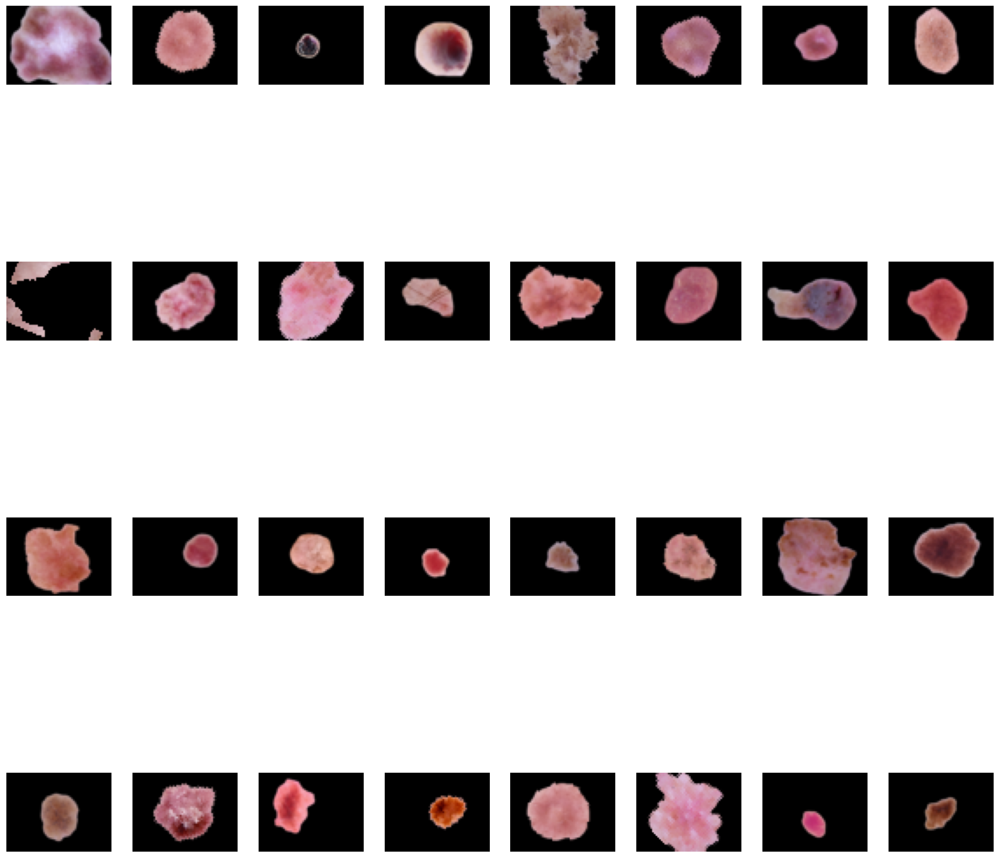

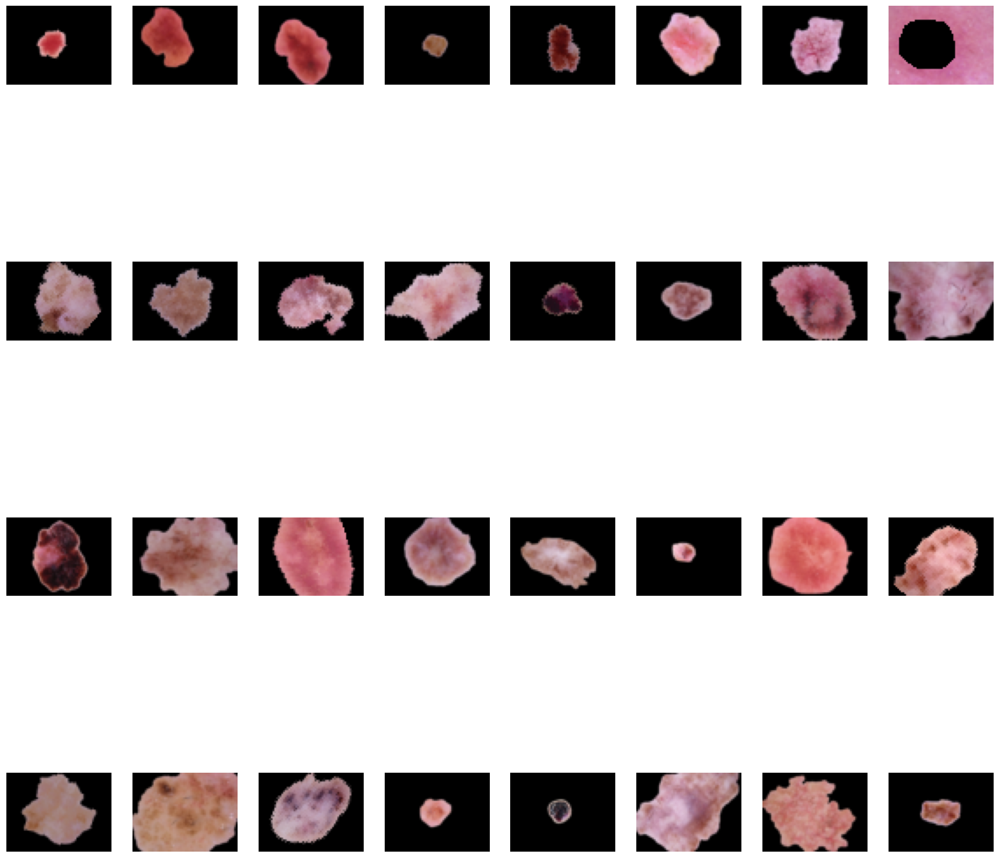

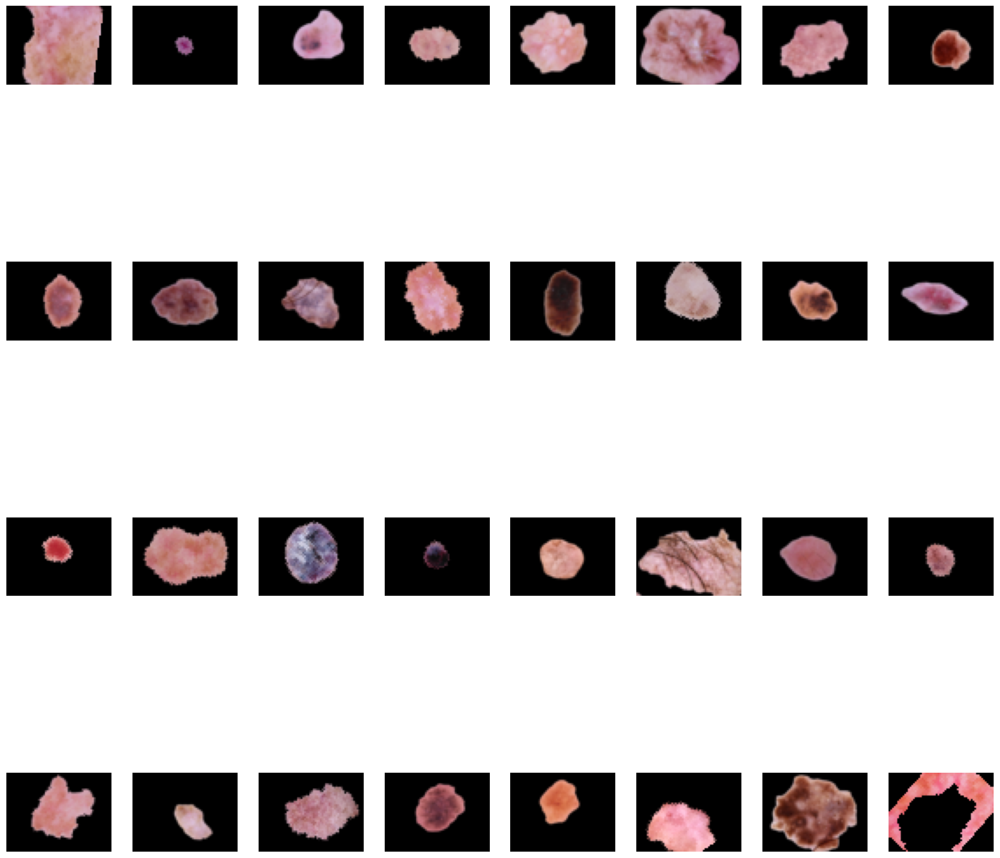

KeyboardInterrupt: 

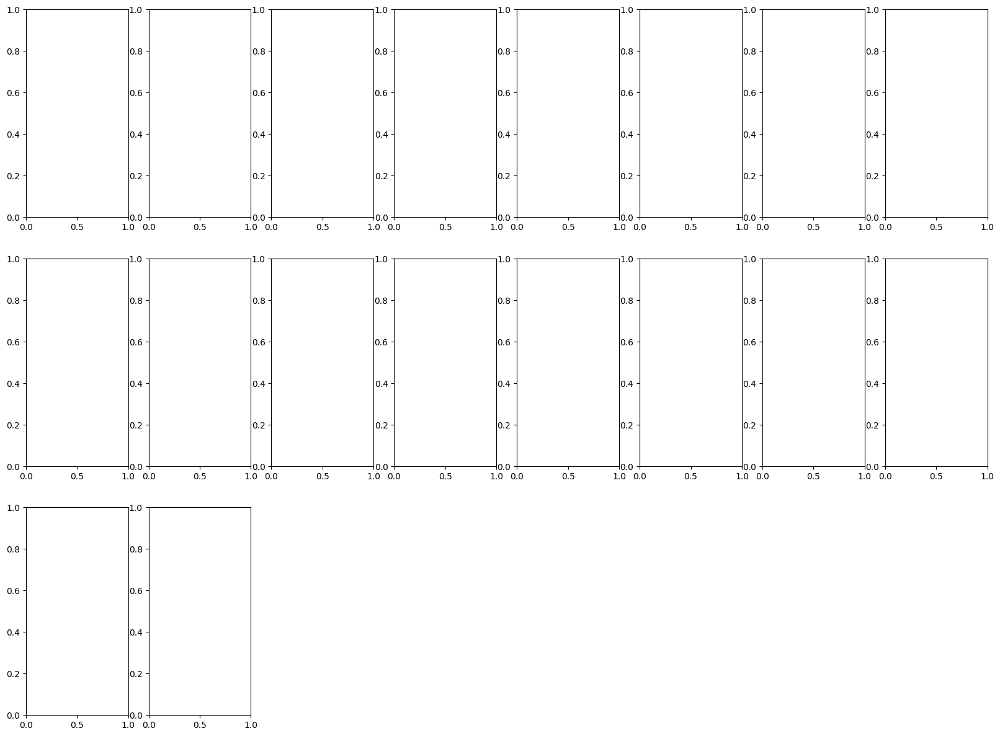

In [46]:
for (batch, labels, segmentations) in train_loader:
        masked_image = torch.mul(batch, segmentations)
        masked_image = masked_image.to(device)

        num_images = masked_image.shape[0]
        rows = 4
        cols = 8

        fig, axes = plt.subplots(rows, cols, figsize=(20, 20))

        for i in range(rows):
            for j in range(cols):
                if i * cols + j < num_images:
                    axes[i, j].imshow(np.transpose(masked_image[i * cols + j], (1, 2, 0)))
                    axes[i, j].axis('off')

        plt.show()

In [34]:
class CNN(nn.Module):
    def __init__(self, input_size, hidden_layers, num_classes, norm_layer=None):
        super(CNN, self).__init__()
        layers = []
        for l in range(len(hidden_layers)):
            input_layer = input_size if l==0 else hidden_layers[l-1]
            layers.append(nn.Conv2d(in_channels=input_layer, out_channels=hidden_layers[l], kernel_size=3, stride=1, padding=1))
            if (norm_layer == 'BN'):
                layers.append(nn.BatchNorm2d(hidden_layers[l]))
            layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(0.1))

        layers.append(nn.Flatten()) #Flattening the images for the linear model
        layers.append(nn.Linear(hidden_layers[-1]*input_size*2, num_classes))

        self.layers = nn.Sequential(*layers)
    
    def forward(self, x):
        out = self.layers(x)
        return out

In [35]:
# TO DO: Add normalization layer
model = CNN(INPUT_SIZE, HIDDEN_SIZE, NUM_CLASSES, norm_layer='BN').to(device)
model.apply(weights_init)
print(model)

CNN(
  (layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): ReLU()
    (4): Dropout(p=0.1, inplace=False)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): ReLU()
    (9): Dropout(p=0.1, inplace=False)
    (10): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (13): ReLU()
    (14): Dropout(p=0.1, inplace=False)
    (15): Conv2d(128, 256, kernel_size=(3, 3), stride=(1

In [36]:
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=REG)

In [37]:
for batch_idx, (images, labels, _) in enumerate(train_loader):
    # Print the size of each image in the batch
    print(f"Batch {batch_idx + 1}, Image size: {images.size()}")

Batch 1, Image size: torch.Size([32, 3, 45, 60])
Batch 2, Image size: torch.Size([32, 3, 45, 60])
Batch 3, Image size: torch.Size([32, 3, 45, 60])
Batch 4, Image size: torch.Size([32, 3, 45, 60])
Batch 5, Image size: torch.Size([32, 3, 45, 60])
Batch 6, Image size: torch.Size([32, 3, 45, 60])
Batch 7, Image size: torch.Size([32, 3, 45, 60])
Batch 8, Image size: torch.Size([32, 3, 45, 60])
Batch 9, Image size: torch.Size([32, 3, 45, 60])
Batch 10, Image size: torch.Size([32, 3, 45, 60])
Batch 11, Image size: torch.Size([32, 3, 45, 60])
Batch 12, Image size: torch.Size([32, 3, 45, 60])
Batch 13, Image size: torch.Size([30, 3, 45, 60])


In [38]:
total_step = len(train_loader)
loss_train = []
loss_val = []
best_accuracy = None
accuracy_val = []
best_model = type(model)(INPUT_SIZE, HIDDEN_SIZE, NUM_CLASSES, norm_layer='BN') # get a new instance
for epoch in range(N_EPOCHS):
    model.train()
    loss_iter = 0
    for i, (images, labels, _) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images) #Prediction
        loss = loss_function(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_iter += loss.item()
        
        if (i+1) % 100 == 0:
            print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'
                   .format(epoch+1, N_EPOCHS, i+1, total_step, loss.item()))
            
    loss_train.append(loss_iter/(len(train_loader)*BATCH_SIZE))

    LR *= LR_DECAY
    update_lr(optimizer, LR)

    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        loss_iter = 0
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            loss = loss_function(outputs, labels)
            loss_iter += loss.item()
        
        loss_val.append(loss_iter/(len(val_loader)*BATCH_SIZE))

        accuracy = 100 * correct / total
        accuracy_val.append(accuracy)
        print('Validation accuracy is: {} %'.format(accuracy))


Validation accuracy is: 3.0 %
Validation accuracy is: 3.0 %
Validation accuracy is: 8.0 %
Validation accuracy is: 18.0 %
Validation accuracy is: 17.0 %


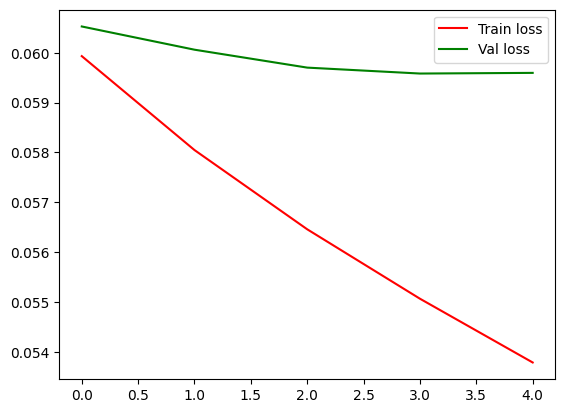

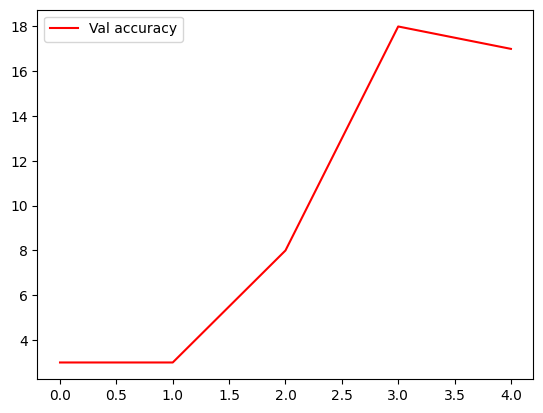

In [39]:
model.eval()

plt.figure(2)
plt.plot(loss_train, 'r', label='Train loss')
plt.plot(loss_val, 'g', label='Val loss')
plt.legend()
plt.show()

plt.figure(3)
plt.plot(accuracy_val, 'r', label='Val accuracy')
plt.legend()
plt.show()